# Objective

- Visually see whether foreground masks are too aggressive and contributing excessively to undercounting.
- Increase "valid area" left after masking (i.e. reduce the "invalid area" of the foreground mask) and see if this mitigates undercounting.
- In doing these things, below I plotted predicted and ground truth spots on images with foreground masks overlaid.


# Result

- By visual inspection, it appears that foreground masks (which I think are the ones accounting for large bubbles) are too aggressive and contributing excessively to undercounting.

- This mask is produced by the class method `prep_cleanup_fg()`, which is called by the class method `cleanup_features()`, which is called by `process_fg_image()`. Of the parameters that eventually go into `prep_cleanup_fg()`, several appear to contribute to the size of the invalid area in the foreground mask, including `bright_thresh`, `grow_factor`, and `grow_cycles`. We can set these parameters simply by editing these parameters in the `pp_params` defined at the top of this notebook (in particular, the params `cleanup_fg_brt_thresh`, `cleanup_fg_grow_factor`, and `cleanup_fg_grow_cycles`).

- Of these, Greg suggested that the parameter that would have the most direct effect on reducing the invalid area of the foreground mask is `grow_factor`.

- I ran tests in **`SW counts vs GT - feature_match_template cc - mask growth_factor effect on bubbles.ipynb`** to determine the best `grow_factor` value, then ran this notebook again to get predicted counts after cci1pi with the adjusted `grow_factor` value.

- I compared the `grow_factor` parameter values in **`compare_grow_factors.ipynb`**.

In [1]:
DATA_DIR_BASE = "data"


import math

from IPython.display import display, Markdown
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import scipy.ndimage
import skimage.feature
import skimage.io
import skimage.transform

import fns

run_names, bg_paths, fg_pathses, gt_data = fns.load_all(
    data_dir_base=DATA_DIR_BASE)

In [2]:
import importlib

import preprocessing


importlib.reload(preprocessing)

<module 'preprocessing' from '/Users/jenny.vophamhi/Desktop/CZB/others/from_greg/2021-07-15 sw counts vs gt vis 20210913/preprocessing.py'>

# Data dir summary

In [3]:
num_fg_paths = 0
num_fg_matched = 0
all_fg_paths = {} # List of FG image paths per run name
for run_name in run_names:
    all_fg_paths[run_name] = [
       x for lane_no in fg_pathses[run_name]
       for x in fg_pathses[run_name][lane_no]]
    num_fg_paths += len(all_fg_paths[run_name])

for run_name in run_names:
    print(f"Run {run_name}:")
    print(f"  BG Lanes:        {','.join(str(x) for x in bg_paths[run_name])}")
    print(f"  Num FG images:   {len(all_fg_paths[run_name])}")
    n_matched = sum(len(x) for x in gt_data[run_name].values()) \
                if run_name in gt_data else 0
    num_fg_matched += n_matched
    print(f"  Num matched GTs: {n_matched}")

unm_gt_ids = ()
if None in gt_data:
    print()
    print("Unmatched GTs:")
    unm_gt_ids = [
        f"  {ts}-{lane_no}"
        for lane_no in gt_data[None]
        for ts in gt_data[None][lane_no]]
    print("\n".join(unm_gt_ids))

print()
print(f"Total FG images:        {num_fg_paths}")
print(f"Total GT files:         {num_fg_matched + len(unm_gt_ids)}")
print(f"Total matched GT files: {num_fg_matched}")

Run 20201217:
  BG Lanes:        5,4,6,7,3,2,0,1
  Num FG images:   8
  Num matched GTs: 4
Run 20201216:
  BG Lanes:        5,4,6,7,3,2,0,1
  Num FG images:   40
  Num matched GTs: 10
Run 20200901:
  BG Lanes:        0,1,3,2,6,7,5,4
  Num FG images:   32
  Num matched GTs: 16
Run 20200916b:
  BG Lanes:        6,7,5,4,0,1,3,2
  Num FG images:   24
  Num matched GTs: 5
Run 20200916a:
  BG Lanes:        5,4,6,7,3,2,0,1
  Num FG images:   16
  Num matched GTs: 5

Unmatched GTs:
  20201002-150536-6
  20201002-132522-6
  20201002-135404-6
  20201002-142245-6
  20201002-140824-4
  20201002-150536-4
  20201002-131101-4
  20201002-132522-4
  20201002-135404-4
  20201002-133942-4
  20201002-145125-4
  20201002-125630-4
  20201002-142245-4
  20201002-131101-2
  20201002-132522-2
  20201002-140824-2
  20201002-135404-2
  20201002-133942-2
  20201002-142245-2
  20201002-125630-2
  20201002-132522-3
  20201002-131101-3
  20201002-135404-3
  20201002-145125-3
  20201002-133942-3
  20201002-142245-3
 

# GT visualization

In [4]:
DOWNSAMPLE_FACTOR = 2
KERNEL_SIZE = 150
DISC_RADIUS = 3

pp_params = {
    "input_rescale_factor":   None,
    "input_gaussian_sigma":   None,
    "align_bg_pixel_thresh":  0.25,
    "align_bg_row_thresh":    0.35,
    "align_mask_margin":      0.01,
    "align_cutout_height":    0.75,
    "align_oversub_factor":   1.05,
    "cleanup_wall_margin":    0.05,
    "cleanup_bg_brt_thresh":  0.25,
    "cleanup_bg_grow_factor": 1.0e-2,
    "cleanup_fg_brt_thresh":  0.05,
    "cleanup_fg_grow_factor": 0,
    "cleanup_fg_grow_cycles": 4,
    "cleanup_fg_size_thresh": 3.0e-4,
    "cleanup_gaussian_sigma": None,
}


def crop_image(img):
    ycrop = int((2048-948)/2)
    xcrop = int((2448-1948)/2)
    return img[ycrop:-1*ycrop,xcrop:-1*xcrop]

def cross_correlate(img, kernel):
    cc_img = skimage.feature.match_template(img, kernel, pad_input=True)
    cc_img[cc_img < 0.] = 0.
    return cc_img

def get_kernel():
    kernel = np.zeros((KERNEL_SIZE, KERNEL_SIZE), 'uint16')
    kernelCtr = KERNEL_SIZE / 2
    for rr in range(0, KERNEL_SIZE + 1):
        for cc in range(0, KERNEL_SIZE + 1):
            if  math.sqrt((rr - kernelCtr)**2 + (cc - kernelCtr)**2) < DISC_RADIUS:
                kernel[rr, cc] = 65535
    return skimage.transform.downscale_local_mean(
        kernel, (DOWNSAMPLE_FACTOR,DOWNSAMPLE_FACTOR))

def find_blobs(cc_img):
    return skimage.feature.blob_dog(
        cc_img, min_sigma=5, max_sigma=15, threshold=0.08, overlap=0.8)

## Run: `20201217`

### Lane 0

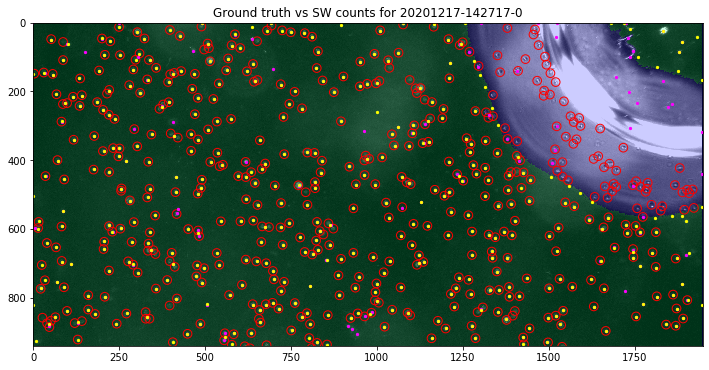

gt_xs:	 519
xs:	 443
pp_xs:	 446
valid:	 0.8482025273135272


### Lane 2

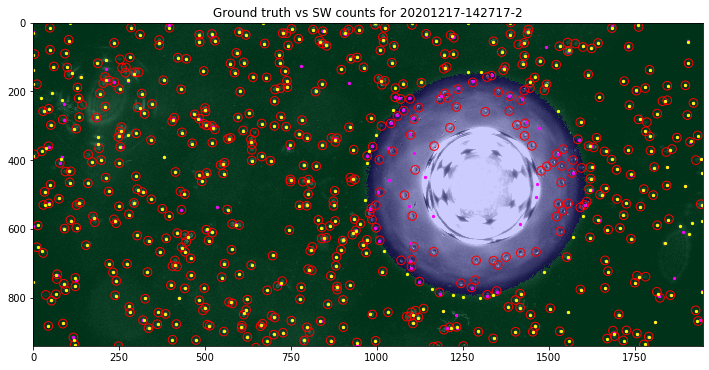

gt_xs:	 568
xs:	 457
pp_xs:	 453
valid:	 0.8251192394666389


### Lane 4

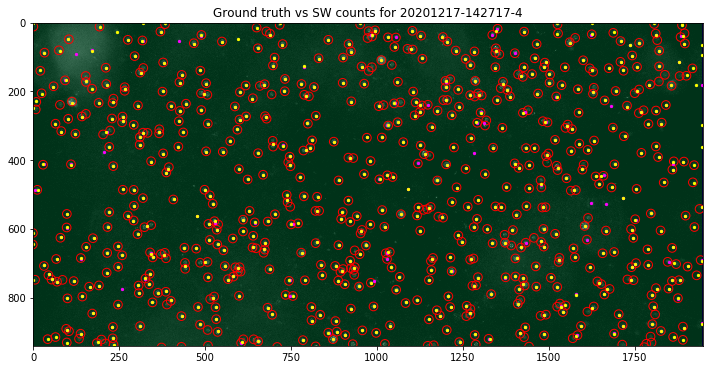

gt_xs:	 674
xs:	 555
pp_xs:	 575
valid:	 0.9979195366447466


### Lane 5

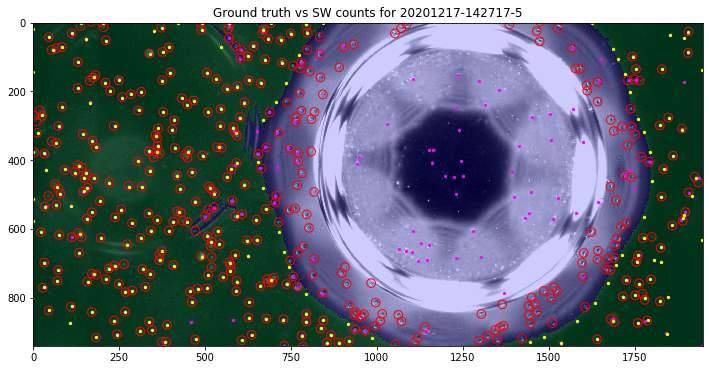

gt_xs:	 410
xs:	 320
pp_xs:	 287
valid:	 0.5051935773139604


## Run: `20201216`

### Lane 1

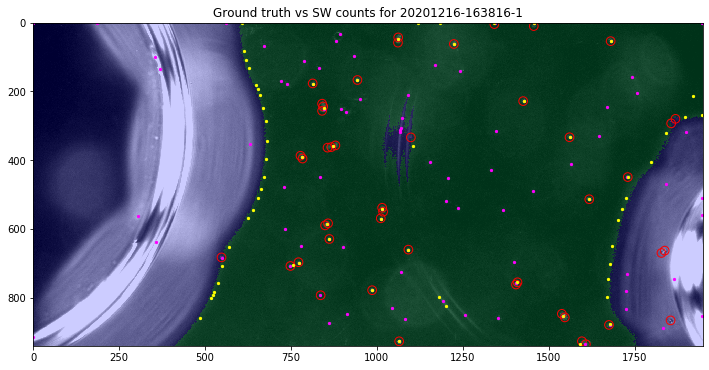

gt_xs:	 46
xs:	 96
pp_xs:	 72
valid:	 0.6133527625434287


### Lane 2

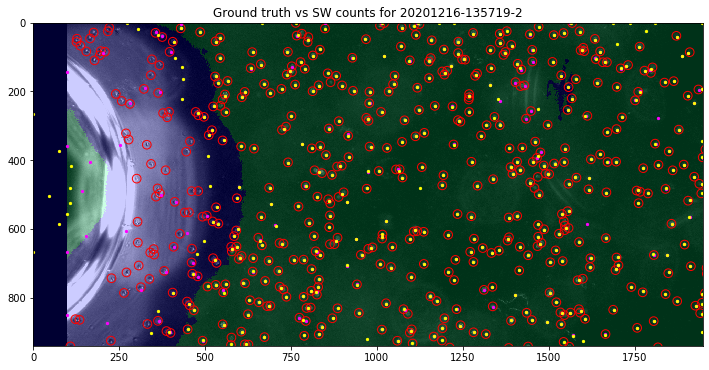

gt_xs:	 514
xs:	 427
pp_xs:	 437
valid:	 0.7424454595863766


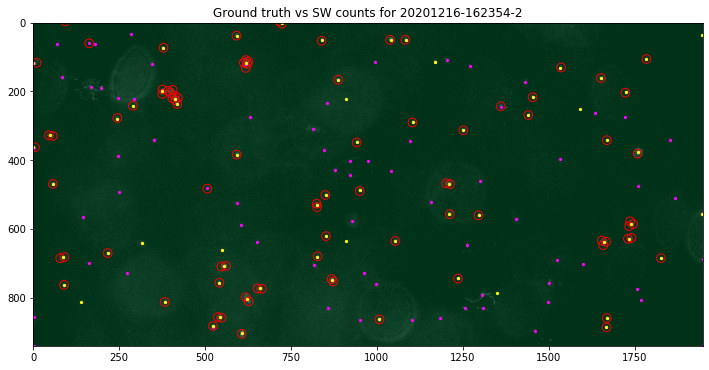

gt_xs:	 88
xs:	 130
pp_xs:	 68
valid:	 0.9921405921035533


### Lane 3

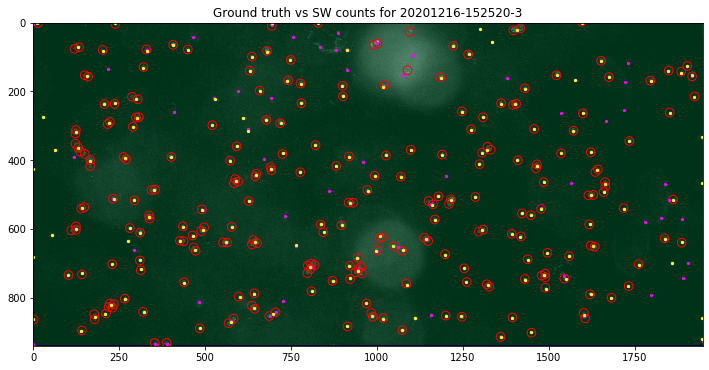

gt_xs:	 251
xs:	 241
pp_xs:	 210
valid:	 0.9878892340082657


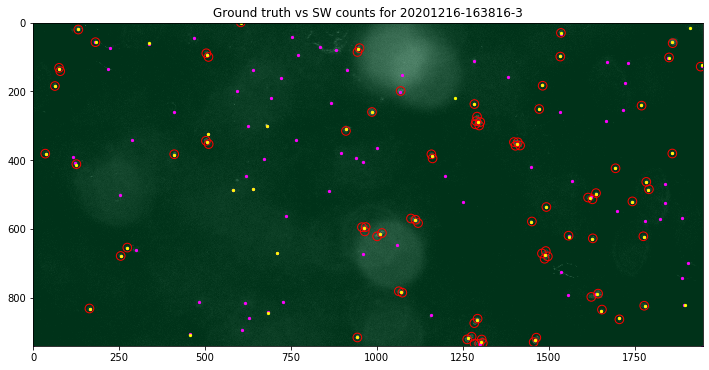

gt_xs:	 84
xs:	 126
pp_xs:	 65
valid:	 0.9957805907172997


### Lane 5

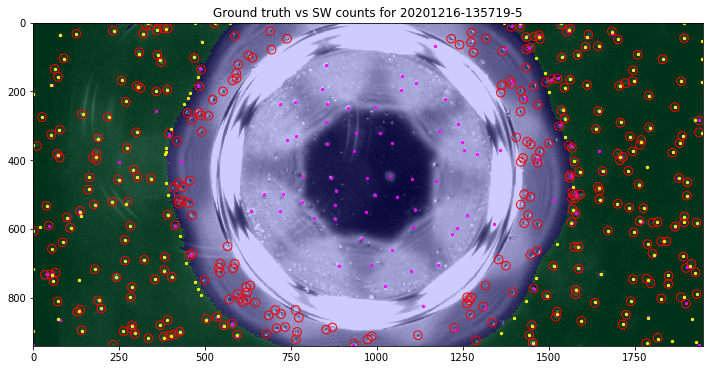

gt_xs:	 332
xs:	 261
pp_xs:	 230
valid:	 0.47406081321099647


### Lane 6

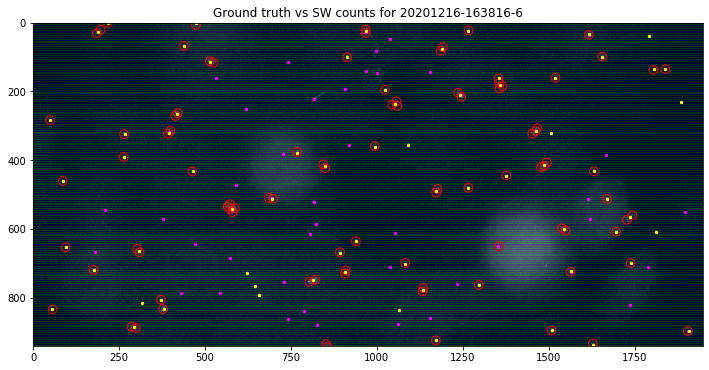

gt_xs:	 93
xs:	 113
pp_xs:	 72
valid:	 1.0000000000000002


### Lane 7

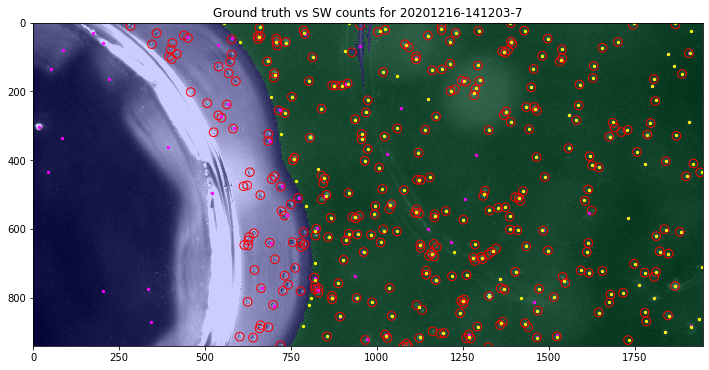

gt_xs:	 331
xs:	 252
pp_xs:	 233
valid:	 0.6180736057321585


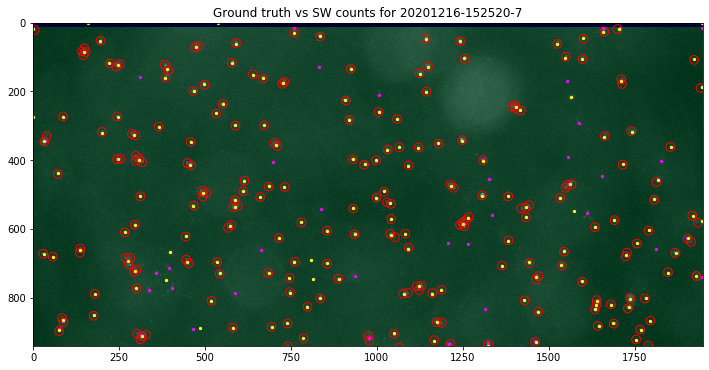

gt_xs:	 230
xs:	 205
pp_xs:	 190
valid:	 0.9831223628691984


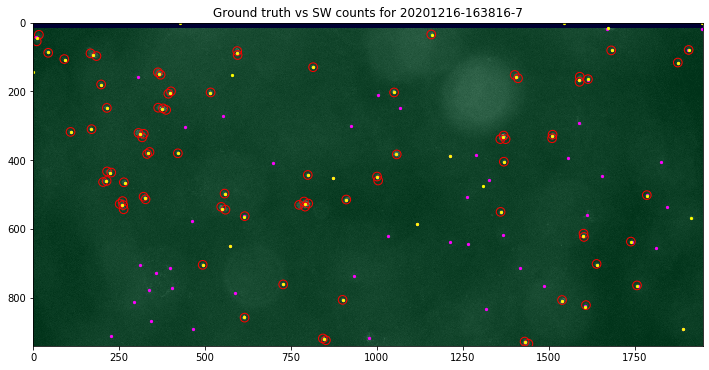

gt_xs:	 84
xs:	 99
pp_xs:	 68
valid:	 0.9794547474852495


## Run: `20200901`

### Lane 0

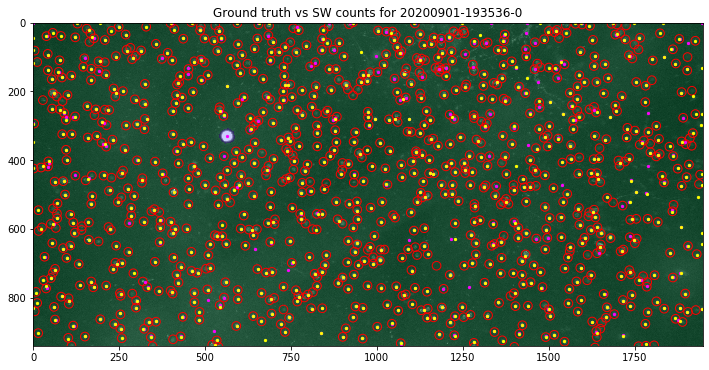

gt_xs:	 977
xs:	 770
pp_xs:	 788
valid:	 0.9991698723780313


### Lane 1

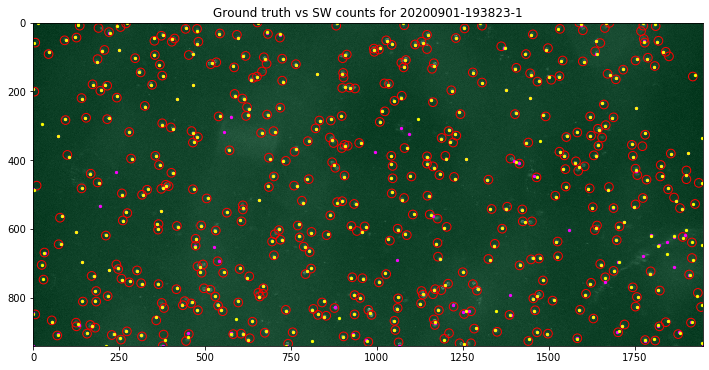

gt_xs:	 450
xs:	 415
pp_xs:	 433
valid:	 0.9931607880851507


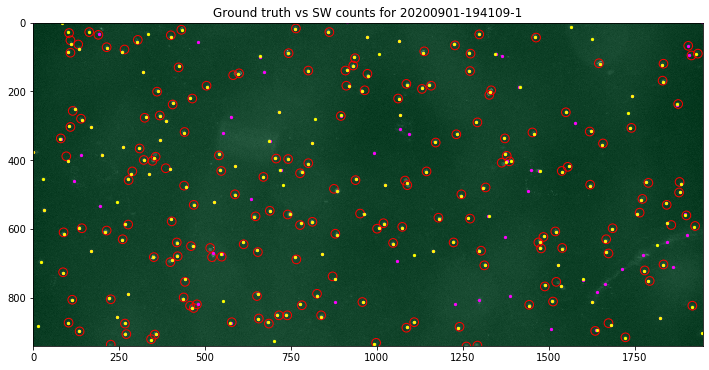

gt_xs:	 188
xs:	 240
pp_xs:	 231
valid:	 0.9978902953586499


### Lane 2

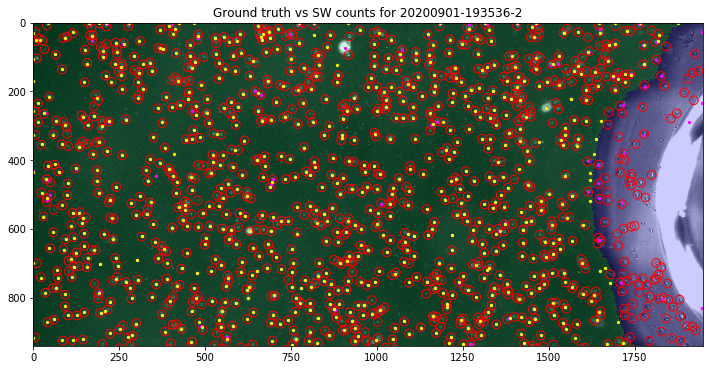

gt_xs:	 1135
xs:	 753
pp_xs:	 791
valid:	 0.8684932723381766


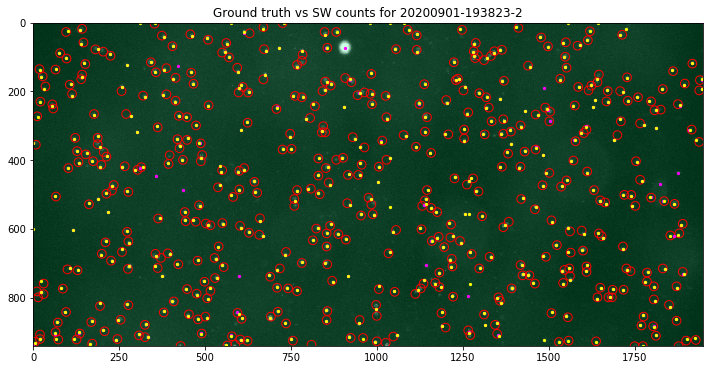

gt_xs:	 460
xs:	 437
pp_xs:	 465
valid:	 0.9989451476793251


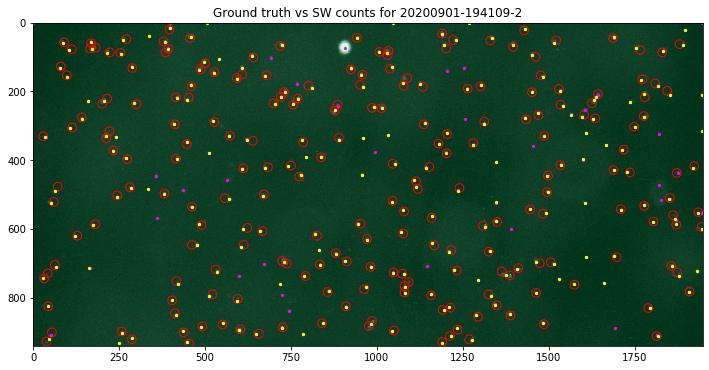

gt_xs:	 224
xs:	 261
pp_xs:	 250
valid:	 0.9989451476793251


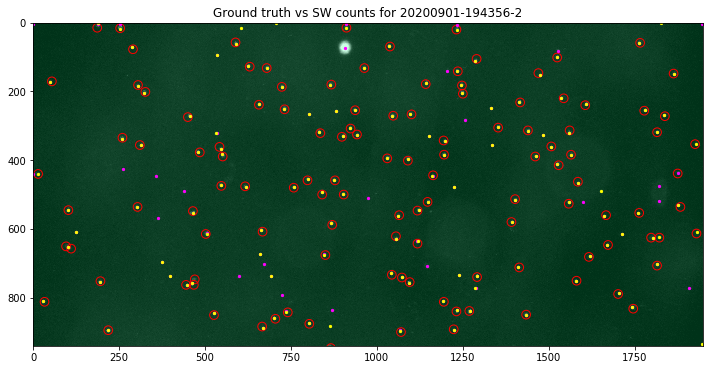

gt_xs:	 120
xs:	 154
pp_xs:	 142
valid:	 0.9957805907172997


### Lane 3

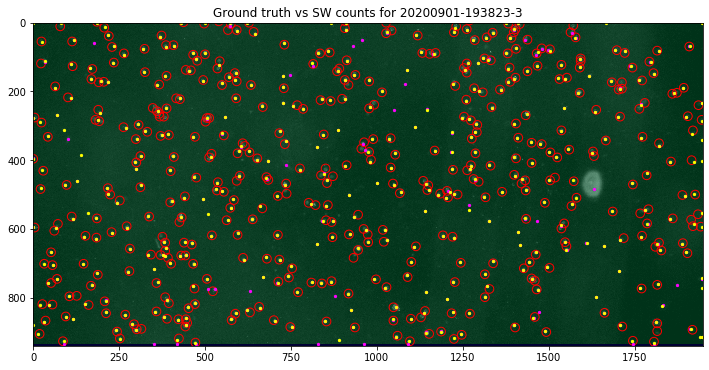

gt_xs:	 448
xs:	 430
pp_xs:	 448
valid:	 0.9868349231928887


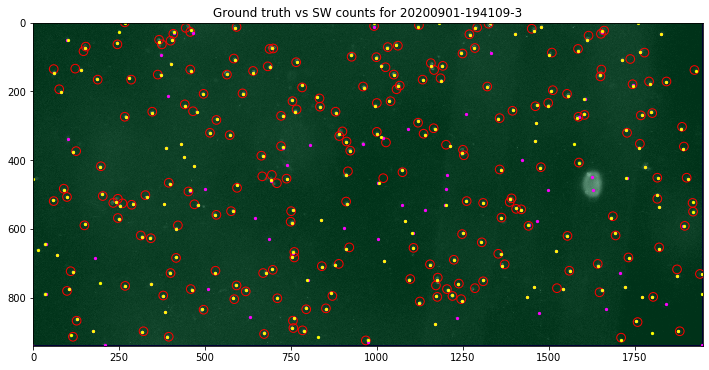

gt_xs:	 221
xs:	 270
pp_xs:	 255
valid:	 0.9894893821641152


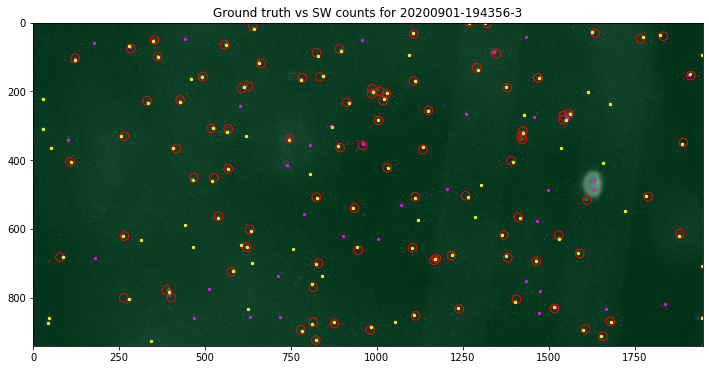

gt_xs:	 98
xs:	 142
pp_xs:	 121
valid:	 0.9931607880851507


### Lane 5

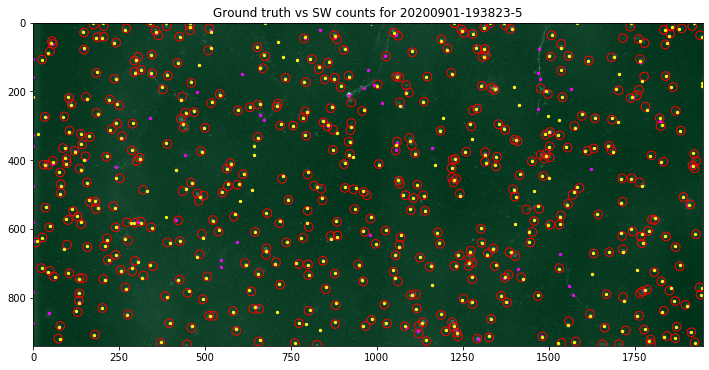

gt_xs:	 485
xs:	 475
pp_xs:	 463
valid:	 0.9973780313466588


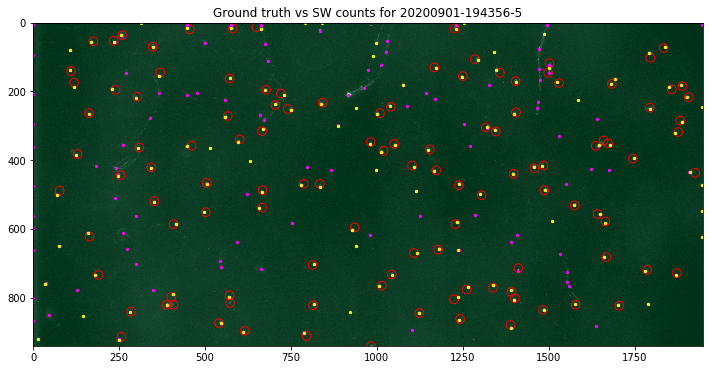

gt_xs:	 115
xs:	 207
pp_xs:	 142
valid:	 0.9931607880851507


### Lane 6

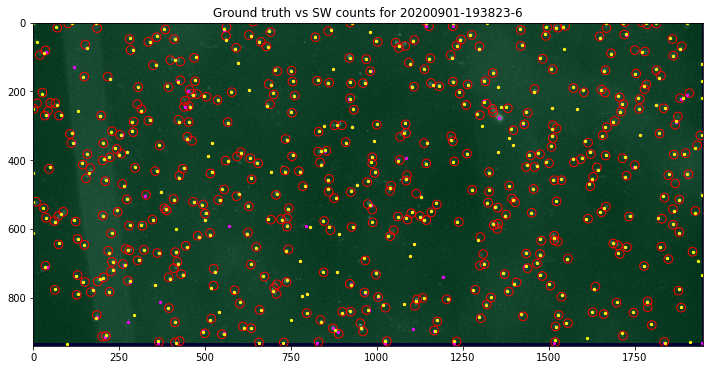

gt_xs:	 457
xs:	 441
pp_xs:	 460
valid:	 0.9831667663036416


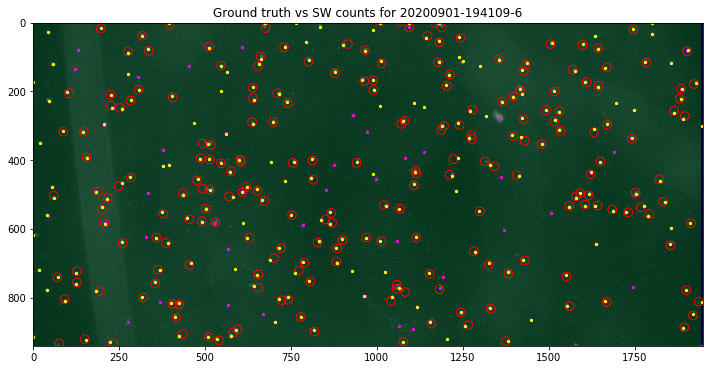

gt_xs:	 217
xs:	 264
pp_xs:	 259
valid:	 0.9900682513277711


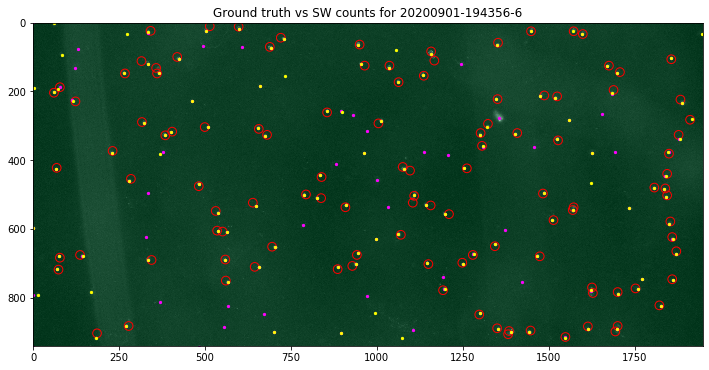

gt_xs:	 113
xs:	 146
pp_xs:	 136
valid:	 0.9968354430379748


### Lane 7

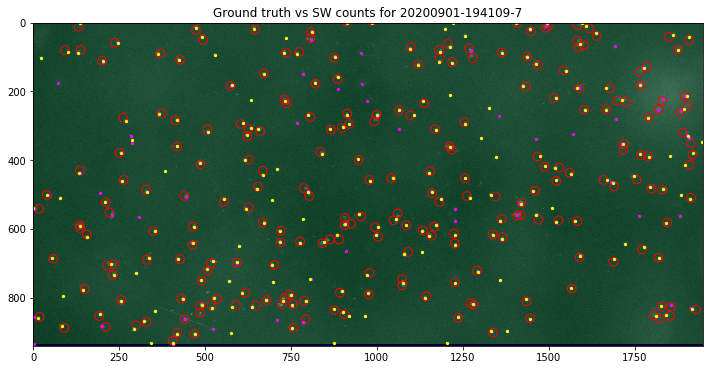

gt_xs:	 239
xs:	 258
pp_xs:	 244
valid:	 0.985314376315858


## Run: `20200916b`

### Lane 0

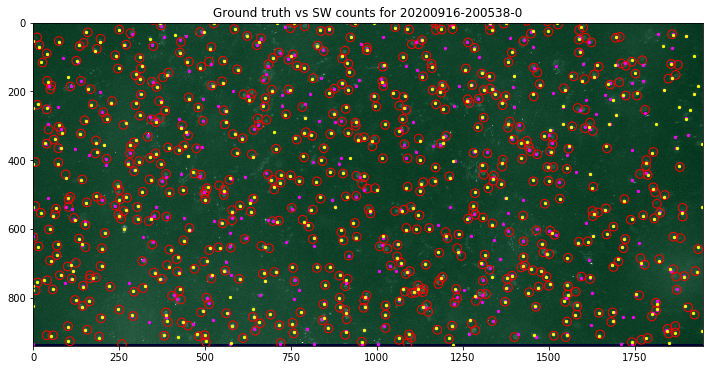

gt_xs:	 658
xs:	 661
pp_xs:	 534
valid:	 0.9868349231928887


### Lane 5

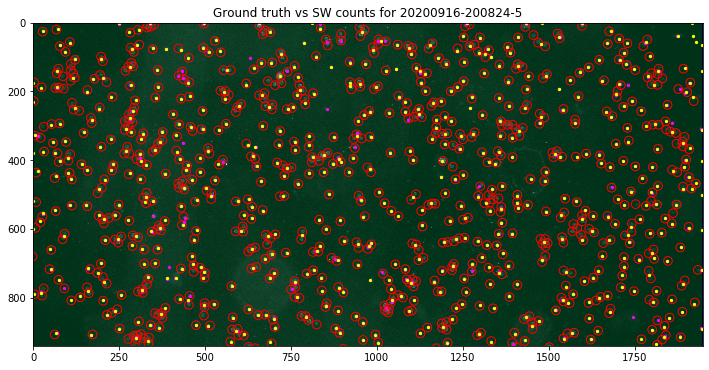

gt_xs:	 847
xs:	 609
pp_xs:	 623
valid:	 0.9953002755178958


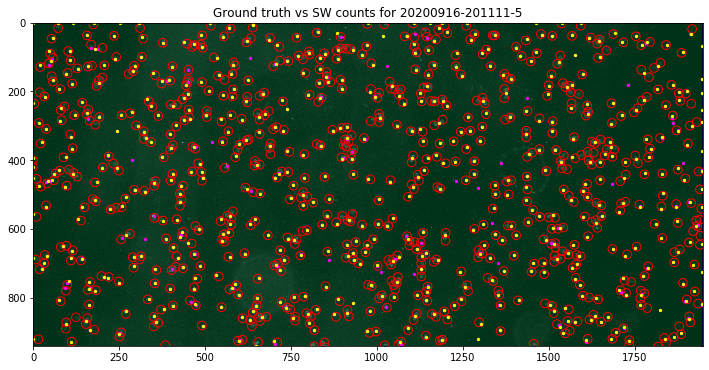

gt_xs:	 804
xs:	 616
pp_xs:	 629
valid:	 0.9958119980245888


### Lane 6

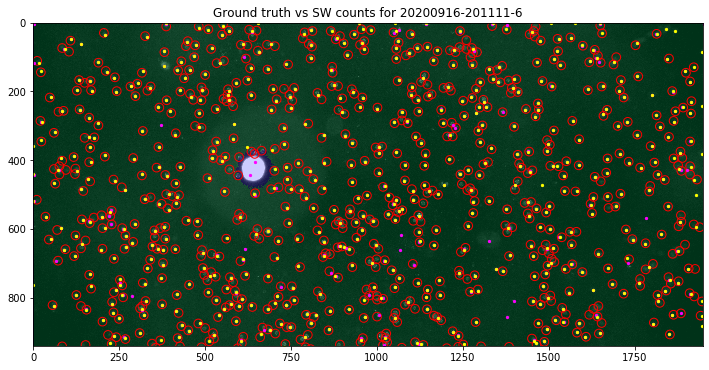

gt_xs:	 756
xs:	 594
pp_xs:	 614
valid:	 0.9898895545794021


### Lane 7

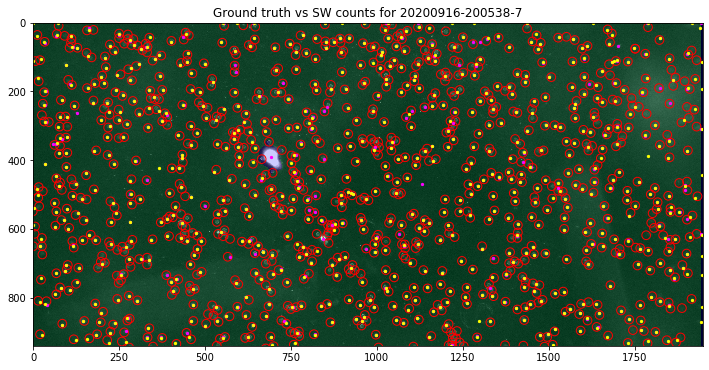

gt_xs:	 1010
xs:	 708
pp_xs:	 749
valid:	 0.9941387466534973


## Run: `20200916a`

### Lane 1

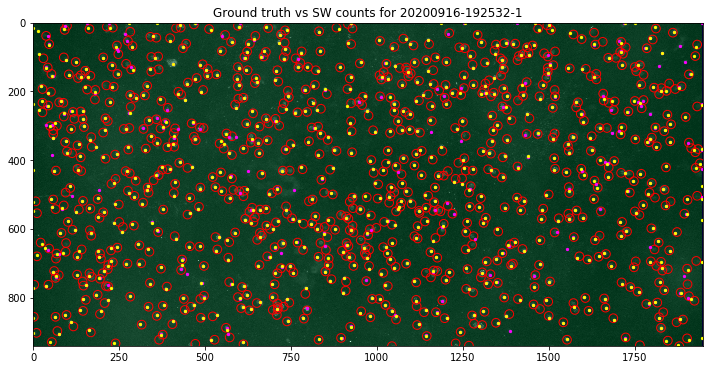

gt_xs:	 882
xs:	 714
pp_xs:	 716
valid:	 0.9979195366447466


### Lane 2

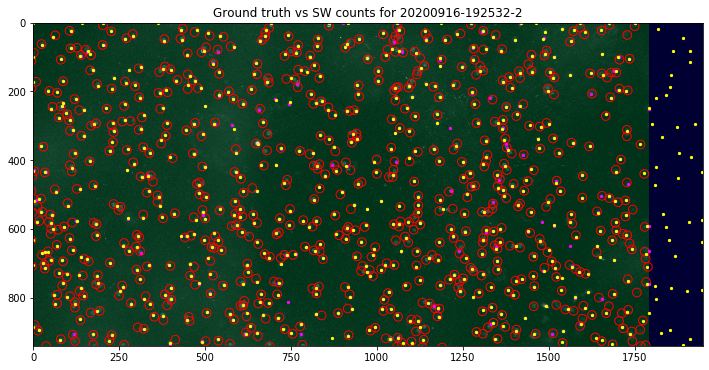

gt_xs:	 753
xs:	 647
pp_xs:	 660
valid:	 0.9189236607490969


### Lane 4

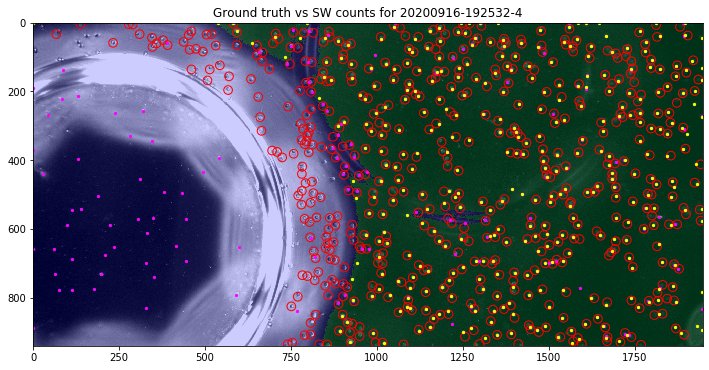

gt_xs:	 579
xs:	 445
pp_xs:	 393
valid:	 0.5498168629081868


### Lane 5

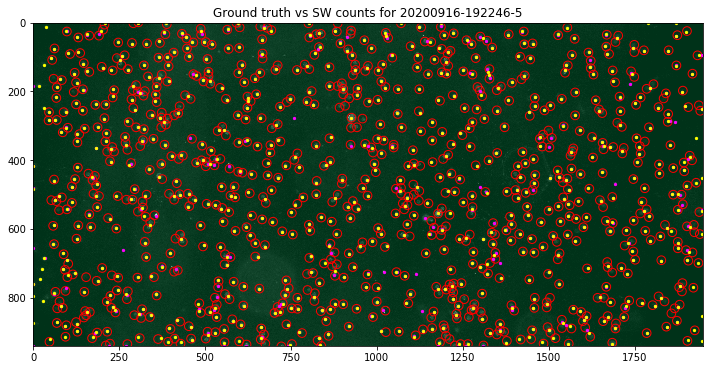

gt_xs:	 904
xs:	 724
pp_xs:	 741
valid:	 0.9942150989005277


### Lane 7

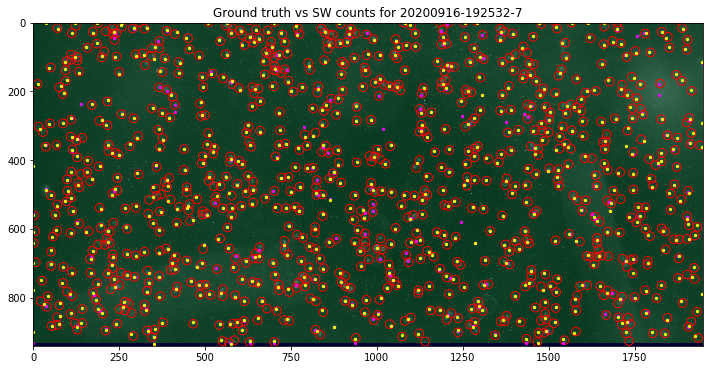

gt_xs:	 927
xs:	 724
pp_xs:	 753
valid:	 0.9836719907467576


In [5]:
kernel = get_kernel()

gt_xs_list, xs_list, pp_xs_list = [], [], []
run_name_list, lane_no_list, ts_list = [], [], []
valid_fraction_list = []

for run_name in run_names:
    if run_name not in gt_data:
        continue
    display(Markdown(f'## Run: `{run_name}`'))
    for lane_no in sorted(gt_data[run_name].keys()):
        pp = preprocessing.Cci1ImagePreprocessing(**pp_params)
        pp.set_bg_image_from_path(bg_paths[run_name][lane_no])
        display(Markdown(f'### Lane {lane_no}'))
        for ts in sorted(gt_data[run_name][lane_no].keys()):
            plt.figure(figsize=(12.,12.))

            pp_img, valid_area, info = pp.process_fg_image_from_path(
                fg_pathses[run_name][lane_no][ts])

            pp_cc_img = cross_correlate(crop_image(pp_img), kernel)
            pp_ys, pp_xs, pp_sigmas = zip(*(find_blobs(pp_cc_img)))

            cc_img = cross_correlate(crop_image(info["fg_image"]), kernel)
            ys, xs, sigmas = zip(*(find_blobs(cc_img)))
            ys += info["shift"][0]
            xs += info["shift"][1]

            gt_ys, gt_xs = zip(*gt_data[run_name][lane_no][ts])
            gt_ys += info["shift"][0]
            gt_xs += info["shift"][1]

            # Shift image and compress dynamic range for display; mask also
            disp_img = scipy.ndimage.shift(
                crop_image(info["fg_image"]) ** 0.5, info["shift"])
            plt.imshow(disp_img, cmap=plt.cm.gray, vmin=0.3, vmax=1.)
            disp_mask = scipy.ndimage.shift(
                crop_image(info["fg_feature_mask"]) ** 0.5, info["shift"])
            plt.imshow(disp_mask, cmap='winter', alpha=0.2)

            plt.scatter(gt_xs, gt_ys, s=75., facecolors='none', edgecolors='red')
            plt.scatter(xs, ys, s=5., facecolors='magenta')
            plt.scatter(pp_xs, pp_ys, s=5., facecolors='yellow')
                        
            plt.title(f"Ground truth vs SW counts for {ts}-{lane_no}")
            plt.xlim(0, 1948)
            plt.ylim(940, 0)
            plt.show()
            
            gt_xs_list.append(len(gt_xs))
            xs_list.append(len(xs))
            pp_xs_list.append(len(pp_xs))
            run_name_list.append(run_name)
            lane_no_list.append(lane_no)
            ts_list.append(ts)
            
            valid_area = disp_mask.sum()
            total_area = disp_mask.shape[0] * disp_mask.shape[1]
            valid_fraction = valid_area/total_area
            valid_fraction_list.append(valid_fraction)
            
            print('gt_xs:\t', len(gt_xs))
            print('xs:\t', len(xs))
            print('pp_xs:\t', len(pp_xs))
            print('valid:\t', valid_fraction)


In [6]:
data_table = pd.DataFrame({
    'gt_xs': gt_xs_list,
    'xs': xs_list,
    'pp_xs': pp_xs_list,
    'run_name': run_name_list,
    'lane_no': lane_no_list,
    'ts': ts_list,
    'valid_area_fraction': valid_fraction_list
})
data_table.to_csv('pred_gt_counts_gc_mask_reduced.csv', index=None)

In [7]:
data_table

,gt_xs,xs,pp_xs,run_name,lane_no,ts,valid_area_fraction
0,519,443,446,20201217,0,20201217-142717,0.848203
1,568,457,453,20201217,2,20201217-142717,0.825119
2,674,555,575,20201217,4,20201217-142717,0.997920
3,410,320,287,20201217,5,20201217-142717,0.505194
4,46,96,72,20201216,1,20201216-163816,0.613353
5,514,427,437,20201216,2,20201216-135719,0.742445
6,88,130,68,20201216,2,20201216-162354,0.992141
7,251,241,210,20201216,3,20201216-152520,0.987889
8,84,126,65,20201216,3,20201216-163816,0.995781
9,332,261,230,20201216,5,20201216-135719,0.474061
